## Loading Libraries

In [0]:
pip install umap-learn

Python interpreter will be restarted.
  Attempting uninstall: numpy
    Found existing installation: numpy 1.21.6
    Not uninstalling numpy at /local_disk0/.ephemeral_nfs/cluster_libraries/python/lib/python3.9/site-packages, outside environment /local_disk0/.ephemeral_nfs/envs/pythonEnv-bf40055c-cb59-4d91-a7ea-ad8eee79be82
    Can't uninstall 'numpy'. No files were found to uninstall.
  Attempting uninstall: threadpoolctl
    Found existing installation: threadpoolctl 2.2.0
    Not uninstalling threadpoolctl at /databricks/python3/lib/python3.9/site-packages, outside environment /local_disk0/.ephemeral_nfs/envs/pythonEnv-bf40055c-cb59-4d91-a7ea-ad8eee79be82
    Can't uninstall 'threadpoolctl'. No files were found to uninstall.
  Attempting uninstall: scipy
    Found existing installation: scipy 1.7.1
    Not uninstalling scipy at /databricks/python3/lib/python3.9/site-packages, outside environment /local_disk0/.ephemeral_nfs/envs/pythonEnv-bf40055c-cb59-4d91-a7ea-ad8eee79be82
    Can'

In [0]:
pip install hdbscan

Python interpreter will be restarted.
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
    Preparing wheel metadata: started
    Preparing wheel metadata: finished with status 'done'
  Created wheel for hdbscan: filename=hdbscan-0.8.42-cp39-cp39-linux_x86_64.whl size=3671560 sha256=fdc2ef1fcc2906963b1d9539dd65200a4834da198794b41d5821ee75df0b0145
  Stored in directory: /root/.cache/pip/wheels/ed/0d/10/77e52180d41859778f847c91db4c9d7c19af9d3b9975268d1c
Successfully built hdbscan
Python interpreter will be restarted.


In [0]:
%pip install langchain==0.2.4
%pip install langchain-community==0.2.4
%pip install pydantic==2.11.7

Python interpreter will be restarted.
  Attempting uninstall: langchain
    Found existing installation: langchain 0.2.17
    Not uninstalling langchain at /local_disk0/.ephemeral_nfs/cluster_libraries/python/lib/python3.9/site-packages, outside environment /local_disk0/.ephemeral_nfs/envs/pythonEnv-bf40055c-cb59-4d91-a7ea-ad8eee79be82
    Can't uninstall 'langchain'. No files were found to uninstall.
Python interpreter will be restarted.
Python interpreter will be restarted.
Python interpreter will be restarted.
Python interpreter will be restarted.
  Attempting uninstall: pydantic
    Found existing installation: pydantic 1.8.2
    Not uninstalling pydantic at /local_disk0/.ephemeral_nfs/cluster_libraries/python/lib/python3.9/site-packages, outside environment /local_disk0/.ephemeral_nfs/envs/pythonEnv-bf40055c-cb59-4d91-a7ea-ad8eee79be82
    Can't uninstall 'pydantic'. No files were found to uninstall.
ERROR: pip's dependency resolver does not currently take into account all the pac

In [0]:
import pandas as pd
from langchain_community.embeddings import DatabricksEmbeddings
import umap
from collections import Counter
import hdbscan

import numpy as np

from sklearn.cluster import DBSCAN
from sklearn.cluster import SpectralClustering

from langchain.prompts import PromptTemplate
from langchain_community.chat_models import ChatDatabricks

from langchain.text_splitter import RecursiveCharacterTextSplitter

## Data Preparation

In [0]:
df_combined_AUTO = pd.read_csv(r"/dbfs/mnt/cmp/Development/Data/Original/production_train_data.csv")
df_combined_AUTO.shape

/databricks/python/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3524: DtypeWarning: Columns (2,11,12) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)
Out[2]: (50997, 33)

In [0]:
df_combined_AUTO.columns

Out[3]: Index(['SPCL_ACCT_IND', 'SPCL_HNDLNG_IND', 'SUBRO_STATUS_DESC_CONCAT',
       'SUBRO_STATUS_CD', 'CLM_NBR', 'CLM_CLOSE_DT', 'CLM_ENTR_DT',
       'CLM_JRSDTN_ST_DESC', 'ACDNT_STREET_ADDR', 'ACDNT_ST_DESC',
       'ACDNT_WITNS_IND', 'AIA_POSTNS_1_AND_2_DESC_CONCAT',
       'AIA_POSTNS_5_AND_6_DESC_CONCAT', 'CAUSE_OF_LOSS', 'COL_DESC_CONCAT',
       'CLM_LOSS_DESC', 'CLM_SRC_OF_PERIL_DESC', 'FIRST_NOTICE_SUIT_IND',
       'HOW_CLM_RPTD_CD', 'HOW_CLM_RPTD_DESC', 'PAID_FINAL_EXCL_CLM_CLOSE',
       'INCURRED_FINAL_EXCL_60_DAYS', 'BUSNS_SEGMT_DESC', 'BUSNS_SUBDVSN_DESC',
       'SPECLTY_PGM_CATGRY_DESC', 'SPECLTY_PGM_SUBCATGRY_CD',
       'SPECLTY_PGM_SUBCATGRY_DESC', 'MAJ_PERIL_DESC_CONCAT', 'NAICS_CD',
       'JOINED_NOTES', 'SEVERITY', 'CLMNT_FATALITY_IND', 'POLICE_RPT_IND'],
      dtype='object')

In [0]:
# df_edw_notes_alldata = pd.read_csv(r"/dbfs/mnt/NPS/Auto/LTR_Category/DEV/Data/AUTO_NPS_Combined_data.csv")

In [0]:
# excel_path = "/dbfs/FileStore/NPS/Hanover_Auto_Countrywide__EXL_DATA_PULL.xlsx"

# # 1. Read all sheets into a dictionary
# all_sheets = pd.read_excel(excel_path, sheet_name=None)

# # 2. Add a 'Source_Sheet' column to each DataFrame
# list_of_dfs = []
# for sheet_name, df in all_sheets.items():
#     df['Source_Sheet'] = sheet_name
#     list_of_dfs.append(df)

# # 3. Concatenate the list of DataFrames
# df_combined_AUTO = pd.concat(list_of_dfs, ignore_index=True)

In [0]:
# df_final = pd.merge(df_combined_AUTO[['CLM_NBR','[HIDDEN]LTR Categorization',
#                                       'Are there any specifics about your claim experience that you would like to share with us?']], 
#                   df_edw_notes_alldata[['CLM_NBR_U','JOINED_NOTES']], 
#                   how='inner', 
#                   left_on='CLM_NBR', 
#                   right_on='CLM_NBR_U')


df_final = df_combined_AUTO[['CLM_NBR','CLM_LOSS_DESC']].copy()

# df_final = df_final[~df_final['Are there any specifics about your claim experience that you would like to share with us?'].isna()].copy()

# df_final.rename(columns={'Are there any specifics about your claim experience that you would like to share with us?':'Feedback'}, inplace=True)

df_final = df_final.drop_duplicates(subset=['CLM_NBR'])

In [0]:
display(df_final)

CLM_NBR,CLM_LOSS_DESC
19-00280196,**REKEYED FROM OLD CLM#19-00263992**Insured_s employee stole claimant_s items while on the job. Claimant is seeking $2912.00 for reimbursement of stolen items and changing of locks.
15-00901087,Shattered window
19-00835005,Roof leak following landlord repairs. Resulted in water damage to the insureds inventory.
19-00649468,CoronavirusLoss of income due to closing of the Salon becassue of the mandatory stay at home declared and non-essential business must close.
85-00184524,THEFT NOT SURE WHAT WAS TAKEN
19-00424849,using dental x-ray machine and suddenly stopped working. MFG report states damage to sensor due to bite. SEE ALL ATTACHMENTS
85-00351236,Pne of the sprinkler system pipes sprung a leak over the weekend and it created quite a mess in the office and storage area
19-00594516,"A large Petra HVAC Unit installed at The Works in Somersworth was a bit damaged along with the roof. It was still installed despite the damage. It appears itt and the roof was damaged by the riggers - Harnum Crane at 18 Fanaras Drive, Salisbury, MA 01952 Phone 978-255-4827. They are denying so we are looking to the policy_s Installation Floater or under the Gold Endt for Property in Transit, This had been previously reported as a GL claim but appears will be denied as no negligence on part of insured under"
19-00068197,Someone sat on a custom built table and broke it into 2 peices
19-00844552,"New unit owner, mid January. There was some damage to drywall, but cause unknown. Recently starting repairs and discovered water had been leaking from somwhere"


In [0]:
# df_final['[HIDDEN]LTR Categorization'].value_counts()

Out[4]: Promoter     13550
Detractor     4250
Passive       2192
Name: [HIDDEN]LTR Categorization, dtype: int64

In [0]:
# df_final_sample = df_final[df_final['[HIDDEN]LTR Categorization'] == 'Detractor'].reset_index(drop=True)
# df_final_sample.shape

Out[29]: (4250, 3)

In [0]:
df_final_sample = df_final.copy()

## Chunking

In [0]:
# text_splitter = RecursiveCharacterTextSplitter(chunk_size = 100,
#                                                chunk_overlap  = 20,
#                                                length_function = len)

# df_final_sample['Feedback_chunks'] = df_final_sample['Feedback'].apply(lambda x: text_splitter.split_text(x))

In [0]:
# df_final_sample_chunked = df_final_sample.explode('Feedback_chunks')
# df_final_sample_chunked = df_final_sample_chunked.reset_index(drop=True)
# df_final_sample_chunked.shape

Out[9]: (15455, 6)

## Embeddings

In [0]:
# embedding_model = 'databricks-bge-large-en'
embedding_model = 'AzureOpenAI_Text_Embedding3_Large'
embeddings = DatabricksEmbeddings(endpoint=embedding_model)

In [0]:
# Drop rows with NaN in CLM_LOSS_DESC to avoid JSON serialization errors
df_final_sample = df_final_sample.dropna(subset=['CLM_LOSS_DESC']).reset_index(drop=True)
print(f"Rows after dropping NaN: {len(df_final_sample)}")

# Randomly sample 10k rows for embedding generation
df_final_sample = df_final_sample.sample(n=1000, random_state=42).reset_index(drop=True)
print(f"Rows after sampling: {len(df_final_sample)}")

df_final_sample['Feedback_Embeddings'] = df_final_sample['CLM_LOSS_DESC'].apply(lambda x: embeddings.embed_query(x))
embed_dim = len(df_final_sample['Feedback_Embeddings'].iloc[0])
col_list = ['dim_%s'%(i) for i in range(1, embed_dim + 1)]

df_final_embeddings = pd.DataFrame(df_final_sample['Feedback_Embeddings'].to_list(), columns=col_list)

Rows after dropping NaN: 1000
Rows after sampling: 1000


In [0]:
# df_final_sample_chunked['Feedback_Embeddings'] = df_final_sample_chunked['Feedback'].apply(lambda x: embeddings.embed_query(x))
# col_list = ['dim_%s'%(i) for i in range(1,1025)]

# df_final_embeddings_chunked = pd.DataFrame(df_final_sample_chunked['Feedback_Embeddings'].to_list(), columns=col_list)

## Dimensionality Reduction

### Exploratory visualization using t-SNE

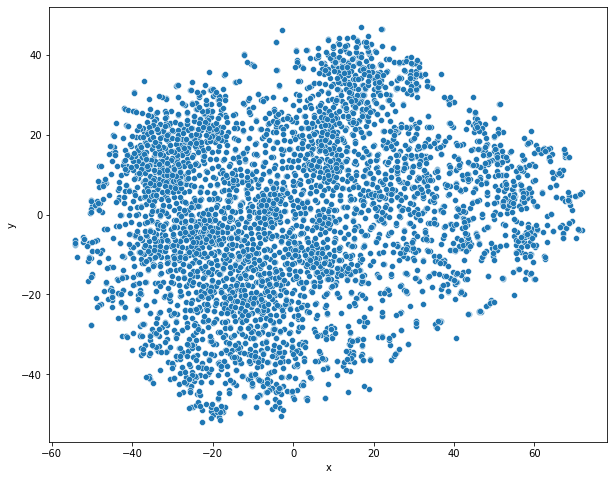

In [0]:
# from sklearn.manifold import TSNE
# import matplotlib.pyplot as plt
# import seaborn as sns

# tsne = TSNE(n_components=2)
# X_tsne = tsne.fit_transform(df_final_embeddings)
# tsne_df = pd.DataFrame(X_tsne, columns=['x', 'y'])

# plt.figure(figsize=(10, 8))
# sns.scatterplot(data=tsne_df, x='x', y='y')
# plt.show()

In [0]:
# tsne = TSNE(n_components=2)
# X_tsne_chunked = tsne.fit_transform(df_final_embeddings_chunked)
# tsne_df_chunked = pd.DataFrame(X_tsne_chunked, columns=['x', 'y'])

# plt.figure(figsize=(10, 8))
# sns.scatterplot(data=tsne_df_chunked, x='x', y='y')
# plt.show()

### UMAP

In [0]:
from sklearn.decomposition import PCA
import numpy as np

# Use PCA to find the number of components that capture 90% variance
pca = PCA().fit(df_final_embeddings)
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
n_components_90 = np.argmax(cumulative_variance >= 0.90) + 1

print(f"Number of components capturing 90% variance: {n_components_90}")

# Use that value as n_components in UMAP
reducer = umap.UMAP(n_neighbors=20, min_dist=0.1, n_components=n_components_90)
reduced_embeddings = reducer.fit_transform(df_final_embeddings)

Number of components capturing 90% variance: 325


In [0]:
col_list = ['dim_%s'%(i) for i in range(1, n_components_90 + 1)]

df_final_embeddings_reduced = pd.DataFrame(reduced_embeddings.tolist(), columns=col_list)
df_final_embeddings_reduced

,dim_1,dim_2,dim_3,dim_4,dim_5,dim_6,dim_7,dim_8,dim_9,dim_10,dim_11,dim_12,dim_13,dim_14,dim_15,dim_16,dim_17,dim_18,dim_19,dim_20,dim_21,dim_22,dim_23,dim_24,dim_25,dim_26,dim_27,dim_28,dim_29,dim_30,dim_31,dim_32,dim_33,dim_34,dim_35,dim_36,dim_37,dim_38,dim_39,dim_40,...,dim_286,dim_287,dim_288,dim_289,dim_290,dim_291,dim_292,dim_293,dim_294,dim_295,dim_296,dim_297,dim_298,dim_299,dim_300,dim_301,dim_302,dim_303,dim_304,dim_305,dim_306,dim_307,dim_308,dim_309,dim_310,dim_311,dim_312,dim_313,dim_314,dim_315,dim_316,dim_317,dim_318,dim_319,dim_320,dim_321,dim_322,dim_323,dim_324,dim_325
0,-0.259525,6.738853,4.492507,4.651512,7.272487,8.889536,7.214204,3.368147,5.085137,5.044424,6.317474,4.660208,5.896034,6.479133,3.769804,6.057940,7.234819,6.041694,5.947449,5.293561,5.784676,4.699744,5.449013,4.845613,4.881254,4.775610,6.394652,7.544335,5.067487,3.800023,4.899149,4.381433,4.581407,4.696576,3.619631,5.145028,6.213224,5.192871,5.686929,4.367074,...,4.962225,5.448180,3.921323,4.610342,3.896825,4.649285,4.844536,3.609611,4.118016,5.504915,5.135042,4.983356,5.128675,4.875264,5.069398,4.719545,5.442624,5.457363,4.370431,4.277625,4.847232,5.041104,6.014157,4.130117,5.164989,5.070901,3.846062,4.729934,5.402514,4.677189,4.748111,4.640872,5.025692,3.972825,5.173652,4.661396,4.800598,4.631614,5.387304,4.857141
1,6.546099,3.579040,5.418719,4.678172,7.414370,8.662992,7.746074,3.300166,4.509443,5.518461,5.892082,4.552697,6.320621,6.470042,3.912612,6.635074,7.096227,5.996121,6.319066,5.029063,5.955857,4.992111,5.206266,5.147671,4.597183,4.619546,6.141133,7.444705,5.454369,3.891873,4.918548,4.289060,4.429914,4.835172,3.562026,5.275112,6.377416,5.042426,5.848018,4.420207,...,4.661670,4.912866,4.634857,4.842969,3.985580,4.584984,4.956395,3.526139,3.741637,5.407364,5.084517,4.747802,4.856064,4.318045,4.920272,4.576859,5.797554,4.773131,4.358188,3.991878,5.350766,5.374290,5.671749,3.856740,5.355666,4.808569,3.935432,5.284288,5.251629,4.516844,4.287320,4.672733,4.549334,4.395441,5.402512,4.959735,4.603602,4.941760,4.311455,4.739717
2,-0.487029,5.835478,4.648291,4.867398,7.405872,8.776568,7.145862,3.392896,5.103271,5.028774,6.330469,4.648517,5.905693,6.492987,3.717778,6.042892,7.179980,6.009925,5.978413,5.320442,5.754151,4.802739,5.472155,4.875816,4.877166,4.837195,6.461812,7.525896,5.083131,3.831251,4.917396,4.360095,4.508053,4.699737,3.587899,5.098173,6.246579,5.182926,5.704505,4.266147,...,4.865670,5.393878,3.940254,4.631400,3.947199,4.647931,4.850501,3.597546,4.102021,5.494476,5.099034,4.982137,5.111032,4.893200,5.095316,4.728663,5.435764,5.489182,4.342937,4.240016,4.915673,5.101382,5.959666,4.080863,5.181465,5.072297,3.842039,4.762065,5.375693,4.677557,4.735853,4.591505,4.993219,4.025673,5.192246,4.704760,4.778051,4.680374,5.385114,4.831863
3,-0.539792,3.815797,5.406215,5.180916,7.908973,8.754734,7.138618,3.552764,5.126390,5.487216,6.287858,4.642863,6.060056,6.787276,3.751467,6.114253,7.130852,5.996643,6.049818,5.251729,5.810374,4.875503,5.455214,4.941254,4.980556,5.044867,6.552937,7.405605,5.235314,3.937681,4.918322,4.137126,4.561521,4.780334,3.530852,5.090331,6.181019,5.177880,5.772524,4.252557,...,4.731541,5.028571,4.219429,4.611676,3.892309,4.682466,5.069282,3.546780,3.987961,5.449951,5.086600,4.949003,5.035021,4.816392,4.935102,4.644308,5.581952,5.212791,4.261553,4.218578,5.195109,5.499622,5.904676,4.070145,5.159085,4.867410,4.028173,4.944251,5.366289,4.504982,4.617651,4.580838,4.702696,4.098582,5.265215,4.531660,4.734724,4.791400,5.220577,4.861601
4,0.449089,5.695732,5.092573,4.783603,7.551379,8.922955,7.322524,3.434755,5.022169,5.236825,6.261668,4.583131,5.892874,6.549873,3.777770,6.076363,7.136187,6.007184,5.925290,5.296347,5.772415,4.886603,5.486428,4.869100,4.908386,4.929895,6.491377,7.415010,5.298188,3.959050,4.985881,4.177016,4.570301,4.765156,3.562312,5.152664,6.192905,5.183025,5.768876,4.333382,...,4.881517,5.254492,4.124094,4.655029,3.870334,4.645290,4.896222,3.569732,4.026016,5.460614,5.119851,4.934369,5.068623,4.795344,5.035

## Clustering

### DBSCAN

In [0]:
df_final_embeddings_reduced_dbscan = df_final_embeddings_reduced.copy()
# df_final_embeddings_reduced_dbscan = tsne_df.copy()

In [0]:
dbscan = DBSCAN(eps=0.7, min_samples=100)
dbscan.fit(df_final_embeddings_reduced_dbscan)

df_final_embeddings_reduced_dbscan['cluster'] = dbscan.labels_

df_final_embeddings_reduced_dbscan['cluster'].value_counts()

Out[38]:  1    1988
 0    1032
-1     475
 3     450
 2     305
Name: cluster, dtype: int64

#### Iterating parameters by comparing DBCV score

In [0]:
df_final_sample_dbscan = pd.concat([df_final_embeddings_reduced_dbscan[['cluster']], 
           df_final_sample[['CLM_NBR','Feedback','[HIDDEN]LTR Categorization']]
           ], axis=1)

display(df_final_sample_dbscan)

cluster,CLM_NBR,Feedback,[HIDDEN]LTR Categorization
0,85-00639889,The adjuster wasn't responsive to emails or voicemails.,Detractor
1,85-00685810,"We were not happy with the service on this claim until I made my agent aware of the lack of service we were getting. I finally requested a new claim representative and got Cross Insurance involved with Hanover to get this claim moving. The first claim rep I had was not doing her job. I could not deal with the lack of care and also her not doing her job. New rep we got was wonderful! We have had Hanover Insurance for many years now and never have I ever had this poor service. The new rep we got called me and the other individual involved in our accident. She did what should have been happening all along. If you are interested in speaking with me on this, please feel free to call me. I'm not sure how to complete this survery, based on the first claims rep or the second one. I'll go with the first rep and you can take it from there.",Detractor
0,85-00678776,The claims manager was not proactive or communicative. I had to inquire and follow up to get a status.,Detractor
0,85-00696529,Claim was paid short by $217.25,Detractor
1,85-00687514,"The adjustor never answered or returned my phone calls. They put the insurance claim in my husband's name, even though he was not in the accident or on the police report. It made it hard to talk to the body shop because they kept wanting to speak to my husband. It took citizens over 3 weeks to get the police report, and that's only because I called and begged for it multiple times. The other person the in accident had progressive and they had the police report within 2 days. We have citizens because they are the cheapest for us but I'm strongly thinking of switching because the experience was just that bad.",Detractor
1,85-00699264,Ignition on car has been repaired but I still cannot open the driver side door and am having trouble getting an estimate to get it fixed,Detractor
1,85-00700504,"It seemed like I constantly had to be “on”our adjusters to get the vehicle returned when we needed it. We got a lot of push back on the body shop we chose. I don’t know the titles of the various people we dealt with, but Dominic was very responsive and helpful",Detractor
-1,85-00675996,The other has admitted to accelerating his vehicle and hitting and now my insurance company is involved and issuing a check to cover the damage. His company should be covering this claim. And I see nothing about getting a rental car.,Detractor
2,85-00679287,"A lack of communication, 3 changes of agents handling my claim and unsatisfactory outcome. I was hit by a driver going way over the speed limit. Your company settled at 50-50 with the other company. I only received 50 % of my deductible. I think that was wrong.",Detractor
1,85-00676948,"I had to reach out to get updates. Otherwise I was not contacted by the adjuster. They also gave me conflicting and inaccurate information from what the auto body shop gave me (which ended up being the correct information). The auto body shop was great to work with, communicated regularly, gave detailed information, and was happy to explain things in further detail",Detractor


### Hierarchical Clustering

In [0]:
df_final_embeddings_reduced_hdbscan = df_final_embeddings_reduced.copy()
# df_final_embeddings_reduced_hdbscan = tsne_df.copy()

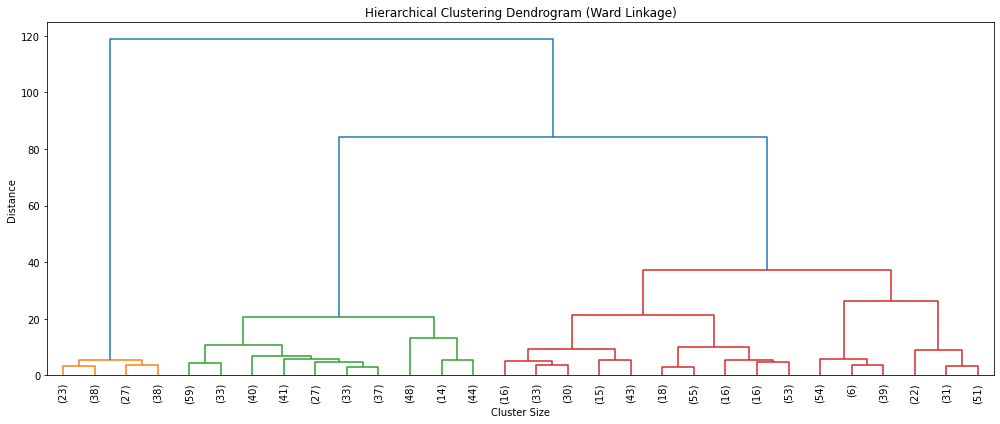

Out[34]: 2    376
0    295
3    126
1    104
4     99
Name: cluster, dtype: int64

In [0]:
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.pyplot as plt

# Plot dendrogram to visualize cluster structure
linked = linkage(df_final_embeddings_reduced_hdbscan, method='ward')

plt.figure(figsize=(14, 6))
dendrogram(linked, truncate_mode='lastp', p=30, leaf_rotation=90)
plt.title('Hierarchical Clustering Dendrogram (Ward Linkage)')
plt.xlabel('Cluster Size')
plt.ylabel('Distance')
plt.tight_layout()
plt.show()

# Fit Agglomerative Clustering
clustering = AgglomerativeClustering(n_clusters=5, linkage='ward')
df_final_embeddings_reduced_hdbscan['cluster'] = clustering.fit_predict(df_final_embeddings_reduced_hdbscan)

df_final_embeddings_reduced_hdbscan['cluster'].value_counts()

#### Mapping clusters with sample data

In [0]:
df_final_sample_hdbscan = pd.concat([df_final_embeddings_reduced_hdbscan[['cluster']], 
           df_final_sample[['CLM_NBR','CLM_LOSS_DESC']]
           ], axis=1)

display(df_final_sample_hdbscan)

cluster,CLM_NBR,CLM_LOSS_DESC
2,19-00249003,Sewer cap blew off and the basement filled with water
3,19-00649775,CORONAVIRUS - Loss of business due to forced closure.
2,19-00631113,Employees came in on Sunday and water had overflowed from the pedicure stations flooding the floor. They tried to put the stations up on stands and put fans up. The bottoms of the stations are cracked after drying out.
4,19-00147764,Power surge caused burning and melting on Motsens boards of 4 printers. See attached email communication.
2,19-00339138,address is 435 Dorothy Day Place / kitchen fire due to pan left on stove/ sprinkler went off and water damage to floors below (fire started on 5th floor )
2,19-00104085,Insured is unsure what is causing water damage in basement and build up of mold.
2,19-00684375,Wind blew sign down
0,19-00342129,Insd_s employee_s watch was stolen while she was on a business trip.
1,19-00364792,DRIVER RAN INTO SIGN OF COMPANY AND KNOCKED IT DOWN DURING BLIZZARD
0,19-00028441,Unknown


In [0]:
# Build claim description dictionary per cluster (sample up to 100 per cluster)
claim_dict_clusterwise = {}

for cluster in sorted(df_final_sample_hdbscan['cluster'].unique()):
    cluster_data = df_final_sample_hdbscan[df_final_sample_hdbscan['cluster'] == cluster]['CLM_LOSS_DESC']
    sample_size = min(100, len(cluster_data))
    claim_dict_clusterwise[cluster] = "; ".join(cluster_data.sample(sample_size, random_state=42))
    print(f"Cluster {cluster}: {len(cluster_data)} claims, sampled {sample_size}")

Cluster 0: 295 claims, sampled 100
Cluster 1: 104 claims, sampled 100
Cluster 2: 376 claims, sampled 100
Cluster 3: 126 claims, sampled 100
Cluster 4: 99 claims, sampled 99


In [0]:
llm_model_name = 'databricks-llama-4-maverick'
llm_model = ChatDatabricks(endpoint=llm_model_name, temperature=0.2, top_p=0.1)

prompt = '''
###Role
You are a property insurance claims analyst. You are provided with a set of claim loss descriptions.
Individual descriptions are separated by a semicolon.

###Steps
1. Read all the individual claim loss descriptions carefully.
2. Identify the single most prominent theme or category of loss across all descriptions.

###Restrictions
1. Return only the theme identified as output (one short phrase).
2. Do not provide output for individual steps.

###Claim Descriptions
{feedback}
'''

final_prompt = PromptTemplate(template=prompt, input_variables=["feedback"])
final_chain = final_prompt | llm_model

topic_identified_cluster_wise = {}

for cluster in sorted(claim_dict_clusterwise.keys()):
    response = final_chain.invoke({'feedback': claim_dict_clusterwise[cluster]})
    topic_identified_cluster_wise[cluster] = response.content
    print(f"Cluster {cluster}: {topic_identified_cluster_wise[cluster]}")

Cluster 0: Theft or Burglary/Vandalism of Business Property
Cluster 1: Vehicle-related damage to property.
Cluster 2: Water damage.
Cluster 3: Business Interruption due to COVID-19
Cluster 4: Equipment breakdown/power surge related damages. 

After re-evaluating the claim descriptions, a more concise theme is: **Power Surge/Equipment Breakdown** 

Let's refine it to: **Equipment Failure** 

The most prominent theme is: **Equipment Failure**


In [0]:
counter_dict = df_final_sample_hdbscan['cluster'].value_counts().to_dict()

output_rows = []
for key in sorted(topic_identified_cluster_wise.keys()):
    output_rows.append([key, topic_identified_cluster_wise[key], counter_dict[key]])

df_topics = pd.DataFrame(output_rows, columns=['cluster', 'topic_identified', 'count'])
display(df_topics)

cluster,topic_identified,count
0,Theft or Burglary/Vandalism of Business Property,295
1,Vehicle-related damage to property.,104
2,Water damage.,376
3,Business Interruption due to COVID-19,126
4,"Equipment breakdown/power surge related damages. After re-evaluating the claim descriptions, a more concise theme is: **Power Surge/Equipment Breakdown** Let's refine it to: **Equipment Failure** The most prominent theme is: **Equipment Failure**",99


### Spectral Clustering

In [0]:
df_final_embeddings_reduced_spectral = df_final_embeddings.copy()
# df_final_embeddings_reduced_spectral = tsne_df.copy()

In [0]:
model = SpectralClustering(n_clusters=8, affinity='rbf')
model.fit(df_final_embeddings_reduced_spectral)

df_final_embeddings_reduced_spectral['cluster'] = model.labels_

df_final_embeddings_reduced_spectral['cluster'].value_counts()

Out[101]: 1    1169
6     613
4     536
2     482
5     414
3     389
7     375
0     272
Name: cluster, dtype: int64

In [0]:
silhouette_score(df_final_embeddings_reduced_spectral, model.labels_)

Out[102]: 0.39913468553676434

#### Iterating parameters by comparing silhouette score

In [0]:
from sklearn.metrics import silhouette_score

for n in range(2,10):
    model = SpectralClustering(n_clusters=n, affinity='rbf')
    model.fit(df_final_embeddings_reduced_spectral)
    print(f'Number of clusters: {n}')
    print(f'Silhouette score: {silhouette_score(df_final_embeddings_reduced_spectral, model.labels_)}')

Number of clusters: 2
Silhouette score: 0.6077981752177325
Number of clusters: 3
Silhouette score: 0.5267305397755861
Number of clusters: 4
Silhouette score: 0.46020600970544057
Number of clusters: 5
Silhouette score: 0.3842522430054135
Number of clusters: 6
Silhouette score: 0.33015838678920056
Number of clusters: 7
Silhouette score: 0.360124495076277
Number of clusters: 8
Silhouette score: 0.39913468553676434
Number of clusters: 9
Silhouette score: 0.372733405296965


In [0]:
df_final_sample_spectral = pd.concat([df_final_embeddings_reduced_spectral[['cluster']], 
           df_final_sample[['CLM_NBR','Feedback','[HIDDEN]LTR Categorization']]
           ], axis=1)

display(df_final_sample_spectral)

cluster,CLM_NBR,Feedback,[HIDDEN]LTR Categorization
4,85-00639889,The adjuster wasn't responsive to emails or voicemails.,Detractor
1,85-00685810,"We were not happy with the service on this claim until I made my agent aware of the lack of service we were getting. I finally requested a new claim representative and got Cross Insurance involved with Hanover to get this claim moving. The first claim rep I had was not doing her job. I could not deal with the lack of care and also her not doing her job. New rep we got was wonderful! We have had Hanover Insurance for many years now and never have I ever had this poor service. The new rep we got called me and the other individual involved in our accident. She did what should have been happening all along. If you are interested in speaking with me on this, please feel free to call me. I'm not sure how to complete this survery, based on the first claims rep or the second one. I'll go with the first rep and you can take it from there.",Detractor
7,85-00678776,The claims manager was not proactive or communicative. I had to inquire and follow up to get a status.,Detractor
2,85-00696529,Claim was paid short by $217.25,Detractor
1,85-00687514,"The adjustor never answered or returned my phone calls. They put the insurance claim in my husband's name, even though he was not in the accident or on the police report. It made it hard to talk to the body shop because they kept wanting to speak to my husband. It took citizens over 3 weeks to get the police report, and that's only because I called and begged for it multiple times. The other person the in accident had progressive and they had the police report within 2 days. We have citizens because they are the cheapest for us but I'm strongly thinking of switching because the experience was just that bad.",Detractor
6,85-00699264,Ignition on car has been repaired but I still cannot open the driver side door and am having trouble getting an estimate to get it fixed,Detractor
1,85-00700504,"It seemed like I constantly had to be “on”our adjusters to get the vehicle returned when we needed it. We got a lot of push back on the body shop we chose. I don’t know the titles of the various people we dealt with, but Dominic was very responsive and helpful",Detractor
2,85-00675996,The other has admitted to accelerating his vehicle and hitting and now my insurance company is involved and issuing a check to cover the damage. His company should be covering this claim. And I see nothing about getting a rental car.,Detractor
2,85-00679287,"A lack of communication, 3 changes of agents handling my claim and unsatisfactory outcome. I was hit by a driver going way over the speed limit. Your company settled at 50-50 with the other company. I only received 50 % of my deductible. I think that was wrong.",Detractor
6,85-00676948,"I had to reach out to get updates. Otherwise I was not contacted by the adjuster. They also gave me conflicting and inaccurate information from what the auto body shop gave me (which ended up being the correct information). The auto body shop was great to work with, communicated regularly, gave detailed information, and was happy to explain things in further detail",Detractor


## Theme Extraction from Clusters

### LLM Prompting

In [0]:
feedback_dictionary_clusterwise = {}

for cluster in df_final_sample_spectral['cluster'].unique():
    feedback_dictionary_clusterwise[cluster] = "; ".join(df_final_sample_spectral[df_final_sample_spectral['cluster']==cluster]['Feedback'].sample(100))

In [0]:
llm_model_name = 'databricks-llama-4-maverick'
llm_model = ChatDatabricks(endpoint=llm_model_name, temperature=0.2, top_p=0.1)

prompt= '''
###Role
You are a customer service agent. You are provided with a set of feedbacks related to claims handling.
Individual feedback are separated by a semicolon.

###Steps
1. Read all the individual feedback carefully.
2. Identify the single most prominent issue across all feedbacks.

###Restrictions
1. Return only the issue identified as output.
2. Do not provide output for individual steps

###Feedbacks
{feedback}
'''

In [0]:
final_prompt = PromptTemplate(template=prompt, input_variables=["feedback"])
final_chain = final_prompt | llm_model

issue_identified_cluster_wise = {}

for cluster in feedback_dictionary_clusterwise.keys():
    response = final_chain.invoke({'feedback':feedback_dictionary_clusterwise[cluster]})
    issue_identified_cluster_wise[cluster] = response.content

In [0]:
issue_identified_cluster_wise

Out[108]: {4: 'The single most prominent issue across all feedbacks is the lack of communication and responsiveness from the adjuster, including not returning phone calls or emails, and not keeping clients updated on the status of their claims.',
 1: 'Lack of communication or unresponsiveness from the claims adjuster or other representatives.',
 7: 'Slow processing and poor communication. However, upon closer inspection, it is clear that the most prominent issue is "Slow processing/Delays" in claims handling. \n\nThe output is: Slow processing/Delays.',
 2: "Deductible handling and reimbursement issues. However, upon closer inspection, a more specific issue is: the insurance company's handling of claims, particularly with regards to deductibles, fault determination, and reimbursement, is causing significant dissatisfaction among customers. A more concise output would be: Deductible and claim handling issues. \n\nHowever, the most prominent issue is: **Deductible and Fault Determination

In [0]:
counter_dict = df_final_embeddings_reduced_spectral['cluster'].value_counts().to_dict()

In [0]:
output_row = []

for key in issue_identified_cluster_wise.keys():
    output_row.append([key, issue_identified_cluster_wise[key], counter_dict[key]])

df_issue_identified = pd.DataFrame(output_row, columns=['cluster','issue_identified','count'])
display(df_issue_identified)

cluster,issue_identified,count
5,Issue : Lack of communication and responsiveness from the adjuster.,266
13,Issue : Poor communication and claims handling,420
7,Issue : Lack of communication and responsiveness from agents and claims handlers.,126
18,"###Issue : Claims Handling Issues, Valuation Disputes, Communication Breakdowns, Delays, and Adjuster Performance Concerns",255
1,Issue : Poor communication and unresponsiveness from claims adjusters,459
10,Issue : Poor claims handling and communication,251
19,"### Issue : Poor claims handling and communication This includes issues such as delayed or no reimbursement for deductibles, lack of communication, adjusters not being helpful or responsive, and disputes over fault and coverage. Many customers expressed frustration with the process, feeling that their claims were not handled properly or that they were not kept informed about the status of their claims. Some also reported being blamed for accidents that were not their fault and having to fight to get their deductibles reimbursed. Overall, the feedback suggests that there are significant issues with the way claims are being handled, leading to a poor customer experience.",276
14,"###Issue : Poor Communication and Claims Handling The most prominent issue across all the feedbacks is the poor communication and claims handling by Citizens Insurance. Customers have expressed frustration with the lack of timely updates, multiple hand-offs, and unresponsive claims representatives. Many have had to repeatedly reach out to get information about their claims, and some have even had to involve their agents or supervisors to get their claims processed. The feedback highlights a need for improved communication, more efficient claims handling, and better customer service. Issue : Poor Communication and Claims Handling",293
8,"Issue : Lack of communication and poor claims handling practices, including unresponsive adjusters, delayed processing, and inadequate follow-up.",142
0,"Issue : Delayed or non-payment of claims and reimbursements, poor communication, and lack of follow-up.",121
